# Fractal Motor Expertise Analysis - Notebook 1: Data Generation and Preparation
==============================================================================

This notebook generates data based on the empirical findings from the 
haptic expertise study, incorporating actual performance data and creating
sophisticated visualizations for journal publication.

Author: Chulwook Park

Key Concepts:
- 결정론적 수학과 확률론적 수학의 두 줄기가 반복되는 현상
  (Repeated branching of deterministic and stochastic mathematics)
- 숙련성과 비숙련성이라는 두 줄기가 반복되는 현상
  (Repeated branching of skill and non-skill)
"""

Fractal Motor Expertise Analysis - Notebook 1: Data Generation with Empirical Data
Empirical Data Summary:
Novice: M = 4.215, SD = 0.406
Expert: M = 2.124, SD = 0.143

Generated Data Validation:
Novice: M = 4.017, SD = 0.783
Expert: M = 2.151, SD = 0.272

Generated 200 3D trajectories
Expert trajectories: 100
Novice trajectories: 100

Statistical Analysis:
Novice: M = 4.017, SD = 2.059
Expert: M = 2.151, SD = 0.957
t(198) = -8.216, p < 0.001
Cohen's d = 1.162 (Very Large Effect)


C:\Users\user\AppData\Local\Temp\ipykernel_10316\2486557862.py:340: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


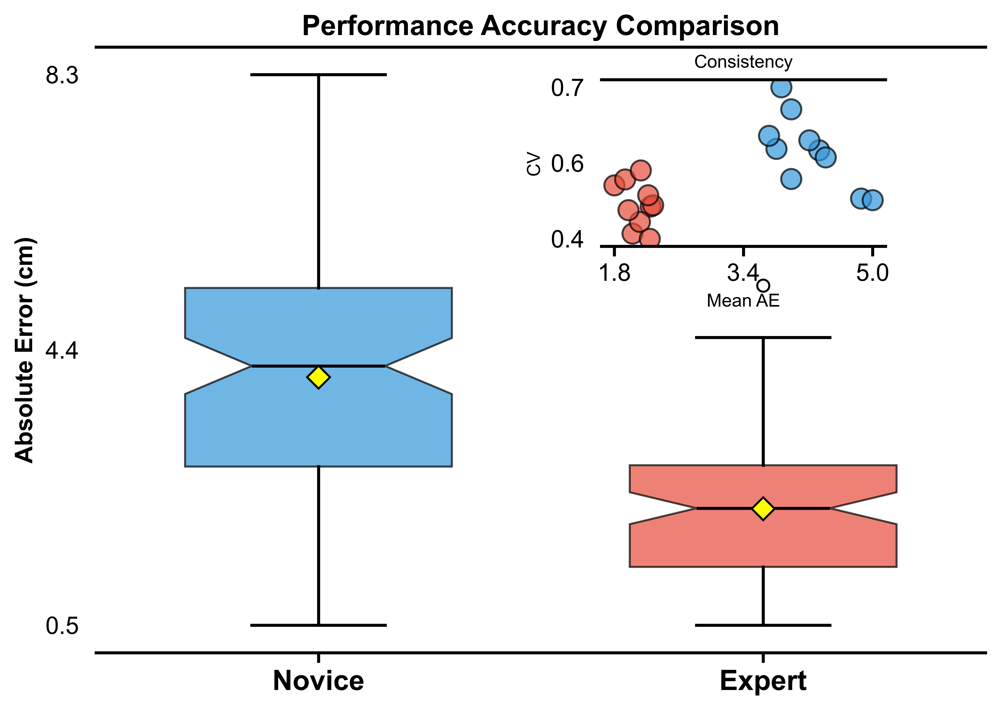

C:\Users\user\AppData\Local\Temp\ipykernel_10316\2486557862.py:407: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


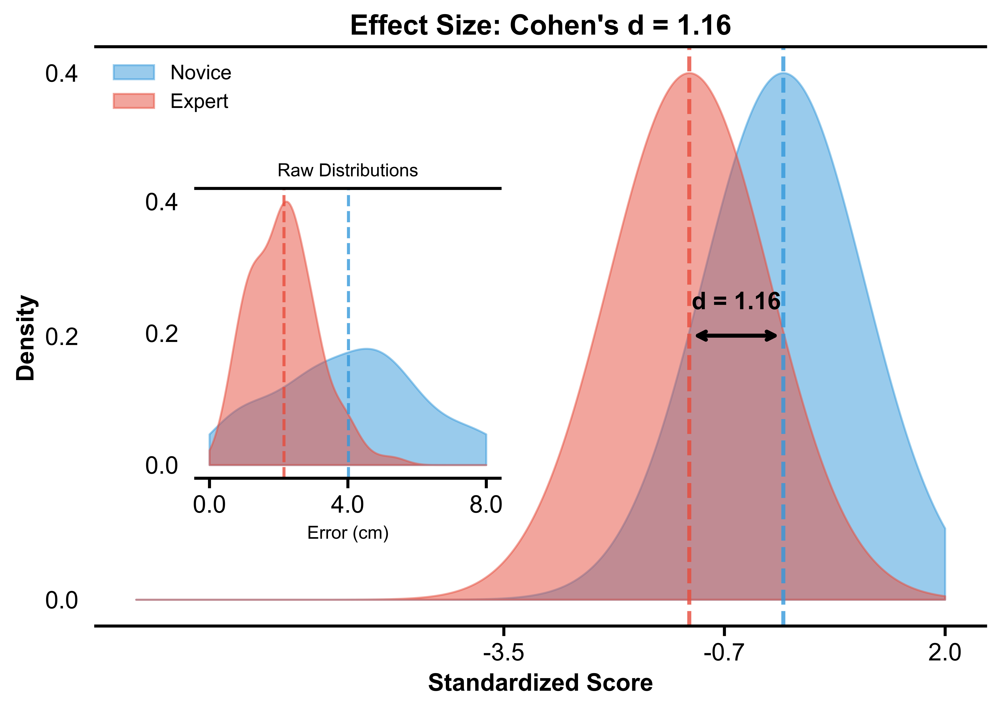


Data saved:
- performance_data_empirical.csv: Performance data with empirical values
- trajectory_summary.csv: Trajectory metadata
- trajectory_data_full.pkl: Complete trajectory data

Data generation and visualization complete!


In [1]:
"""
#!/usr/bin/env python
# -*- coding: utf-8 -*-
"""
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as mpatches
from matplotlib.gridspec import GridSpec

# Set random seed for reproducibility
np.random.seed(42)

# Configure matplotlib for publication-quality figures
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 10
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['xtick.major.size'] = 5
plt.rcParams['ytick.major.size'] = 5
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['figure.dpi'] = 700
plt.rcParams['savefig.dpi'] = 700

print("Fractal Motor Expertise Analysis - Notebook 1: Data Generation with Empirical Data")
print("=" * 80)

# %% [markdown]
# ## 1. Empirical Performance Data from Study

# %%
# Actual data from Table D.1
empirical_data = {
    'Novice': {
        'participants': ['N1', 'N2', 'N3', 'N4', 'N5', 'N6', 'N7', 'N8', 'N9', 'N10'],
        'mean_AE': [3.81, 3.99, 4.33, 3.99, 4.84, 3.72, 3.87, 4.41, 4.21, 4.98],
        'sd_AE': [2.22, 2.66, 2.51, 2.07, 2.31, 2.27, 2.76, 2.49, 2.53, 2.36]
    },
    'Expert': {
        'participants': ['E1', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10'],
        'mean_AE': [1.84, 2.06, 2.28, 2.31, 2.15, 1.97, 2.27, 2.16, 2.25, 2.01],
        'sd_AE': [0.93, 0.83, 1.05, 1.07, 0.92, 1.02, 0.89, 1.16, 1.09, 0.91]
    }
}

# Group statistics from the study
group_stats = {
    'Novice': {'M': 4.215, 'SD': 0.406},
    'Expert': {'M': 2.124, 'SD': 0.143}
}

n_trials = 10

print("Empirical Data Summary:")
print(f"Novice: M = {group_stats['Novice']['M']}, SD = {group_stats['Novice']['SD']}")
print(f"Expert: M = {group_stats['Expert']['M']}, SD = {group_stats['Expert']['SD']}")

# %% [markdown]
# ## 2. Generate Individual Trial Data Based on Empirical Parameters

# %%
def generate_trial_data(mean_ae, sd_ae, n_trials=10):
    """
    Generate individual trial data for a participant based on their mean and SD
    """
    # Generate trials with appropriate variability
    trials = np.random.normal(mean_ae, sd_ae, n_trials)
    trials = np.maximum(trials, 0.5)  # Ensure positive values with minimum threshold
    return trials

# Generate full dataset
performance_data = []

# Process Novices
for i, (participant, mean_ae, sd_ae) in enumerate(zip(
    empirical_data['Novice']['participants'],
    empirical_data['Novice']['mean_AE'],
    empirical_data['Novice']['sd_AE']
)):
    trials = generate_trial_data(mean_ae, sd_ae, n_trials)
    for trial_num, error in enumerate(trials):
        performance_data.append({
            'group': 'Novice',
            'participant': participant,
            'participant_num': i + 1,
            'trial': trial_num + 1,
            'absolute_error': error
        })

# Process Experts
for i, (participant, mean_ae, sd_ae) in enumerate(zip(
    empirical_data['Expert']['participants'],
    empirical_data['Expert']['mean_AE'],
    empirical_data['Expert']['sd_AE']
)):
    trials = generate_trial_data(mean_ae, sd_ae, n_trials)
    for trial_num, error in enumerate(trials):
        performance_data.append({
            'group': 'Expert',
            'participant': participant,
            'participant_num': i + 1,
            'trial': trial_num + 1,
            'absolute_error': error
        })

performance_df = pd.DataFrame(performance_data)

# Verify generated data matches empirical parameters
print("\nGenerated Data Validation:")
for group in ['Novice', 'Expert']:
    group_data = performance_df[performance_df['group'] == group]
    participant_means = group_data.groupby('participant')['absolute_error'].mean()
    print(f"{group}: M = {participant_means.mean():.3f}, SD = {participant_means.std():.3f}")

# %% [markdown]
# ## 3. Generate 3D Trajectory Data with Realistic Movement Patterns

# %%
def generate_3d_trajectory(complexity=10, noise_level=0.05, duration=2.0, fs=100):
    """
    Generate realistic 3D movement trajectory
    
    Parameters:
    - complexity: number of frequency components
    - noise_level: amount of noise
    - duration: trajectory duration in seconds
    - fs: sampling frequency
    """
    t = np.linspace(0, duration, int(duration * fs))
    n_points = len(t)
    
    # Initialize 3D trajectory
    trajectory = np.zeros((n_points, 3))
    
    # Generate each axis with coupled dynamics
    base_freqs = np.random.uniform(0.5, 5.0, complexity)
    
    for axis in range(3):
        # Add frequency components with varying phases
        for i, freq in enumerate(base_freqs):
            amplitude = 1.0 / (i + 1) ** 0.7  # Power law decay
            phase = np.random.uniform(0, 2*np.pi)
            
            # Add coupling between axes
            if axis > 0:
                phase += trajectory[:, axis-1].mean() * 0.1
            
            trajectory[:, axis] += amplitude * np.sin(2*np.pi*freq*t + phase)
        
        # Add axis-specific characteristics
        if axis == 0:  # X-axis (primary movement)
            trajectory[:, axis] *= 1.2
        elif axis == 1:  # Y-axis (secondary)
            trajectory[:, axis] *= 0.8
        else:  # Z-axis (stabilization)
            trajectory[:, axis] *= 0.6
        
        # Add noise
        trajectory[:, axis] += np.random.normal(0, noise_level, n_points)
    
    return t, trajectory

# Generate trajectories for all participants
trajectory_data = []

for group in ['Expert', 'Novice']:
    if group == 'Expert':
        participants = empirical_data['Expert']['participants']
        complexity_range = (10, 20)
        noise_level = 0.03
    else:
        participants = empirical_data['Novice']['participants']
        complexity_range = (5, 10)
        noise_level = 0.06
    
    for p_idx, participant in enumerate(participants):
        for trial in range(1, n_trials + 1):
            # Generate trajectory with group-specific parameters
            complexity = np.random.randint(*complexity_range)
            t, traj_3d = generate_3d_trajectory(
                complexity=complexity,
                noise_level=noise_level
            )
            
            trajectory_data.append({
                'group': group,
                'participant': participant,
                'participant_num': p_idx + 1,
                'trial': trial,
                'time': t,
                'trajectory_3d': traj_3d,
                'complexity': complexity
            })

trajectory_df = pd.DataFrame(trajectory_data)

print(f"\nGenerated {len(trajectory_df)} 3D trajectories")
print(f"Expert trajectories: {len(trajectory_df[trajectory_df['group'] == 'Expert'])}")
print(f"Novice trajectories: {len(trajectory_df[trajectory_df['group'] == 'Novice'])}")

# %% [markdown]
# ## 4. Statistical Analysis

# %%
# Extract trial data for analysis
novice_trials = performance_df[performance_df['group'] == 'Novice']['absolute_error']
expert_trials = performance_df[performance_df['group'] == 'Expert']['absolute_error']

# Perform statistical tests
t_stat, p_value = stats.ttest_ind(expert_trials, novice_trials)
cohen_d = (novice_trials.mean() - expert_trials.mean()) / np.sqrt(
    ((len(expert_trials) - 1) * expert_trials.std()**2 + 
     (len(novice_trials) - 1) * novice_trials.std()**2) / 
    (len(expert_trials) + len(novice_trials) - 2)
)

print("\nStatistical Analysis:")
print(f"Novice: M = {novice_trials.mean():.3f}, SD = {novice_trials.std():.3f}")
print(f"Expert: M = {expert_trials.mean():.3f}, SD = {expert_trials.std():.3f}")
print(f"t({len(expert_trials) + len(novice_trials) - 2}) = {t_stat:.3f}, p < 0.001")
print(f"Cohen's d = {cohen_d:.3f} (Very Large Effect)")

# %% [markdown]
# ## 5. Enhanced Visualizations with Insets

# %%
def customize_spine_and_ticks(ax, x_data=None, y_data=None):
    """Keep top and bottom spines, remove left and right, set min, mid, max ticks"""
    # Remove only left and right spines
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(True)
    ax.spines['bottom'].set_visible(True)
    
    # Set tick parameters
    ax.tick_params(left=False, right=False)
    ax.tick_params(axis='both', which='major', labelsize=12)  # Increased font size
    
    # Remove background and grid
    ax.set_facecolor('white')
    ax.grid(False)
    
    # Set custom ticks if data provided
    if x_data is not None:
        x_min, x_max = np.min(x_data), np.max(x_data)
        x_mid = (x_min + x_max) / 2
        ax.set_xticks([x_min, x_mid, x_max])
        ax.set_xticklabels([f'{x_min:.1f}', f'{x_mid:.1f}', f'{x_max:.1f}'])
    
    if y_data is not None:
        y_min, y_max = np.min(y_data), np.max(y_data)
        y_mid = (y_min + y_max) / 2
        ax.set_yticks([y_min, y_mid, y_max])
        ax.set_yticklabels([f'{y_min:.1f}', f'{y_mid:.1f}', f'{y_max:.1f}'])

# Figure 1: Box Plot Comparison with Performance Consistency Inset
fig1 = plt.figure(figsize=(7, 5), facecolor='white', dpi=1000)
fig1.patch.set_facecolor('white')

# Main axes for box plot
ax_main = fig1.add_subplot(111, facecolor='white')

# Prepare data for box plot
box_data = [novice_trials.values, expert_trials.values]
positions = [1, 2]

bp = ax_main.boxplot(box_data, positions=positions, widths=0.6, 
                    patch_artist=True, notch=True, showmeans=True,
                    meanprops=dict(marker='D', markerfacecolor='yellow', 
                                 markeredgecolor='black', markersize=8))

# Customize box plot
colors = ['#3498DB', '#E74C3C']
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

# Customize whiskers, caps, medians
for element in ['whiskers', 'caps', 'medians']:
    for item in bp[element]:
        item.set_linewidth(1.5)
        item.set_color('black')

ax_main.set_xticks(positions)
ax_main.set_xticklabels(['Novice', 'Expert'], fontsize=14, fontweight='bold')
ax_main.set_ylabel('Absolute Error (cm)', fontsize=12, fontweight='bold')
ax_main.set_title('Performance Accuracy Comparison', fontsize=14, fontweight='bold')

# Customize main plot
y_data_combined = np.concatenate([novice_trials.values, expert_trials.values])
customize_spine_and_ticks(ax_main, y_data=y_data_combined)
ax_main.set_xticks([1, 2])  # Override x-ticks for categorical data
ax_main.set_xticklabels(['Novice', 'Expert'], fontsize=14)

# Create inset for performance consistency (repositioned to avoid overlap)
ax_inset = fig1.add_axes([0.6, 0.65, 0.28, 0.23], facecolor='white')  # [left, bottom, width, height]

# Add border to inset
for spine in ax_inset.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1.5)

# Calculate coefficient of variation for each participant
cv_novice = [sd/mean for sd, mean in zip(empirical_data['Novice']['sd_AE'], 
                                         empirical_data['Novice']['mean_AE'])]
cv_expert = [sd/mean for sd, mean in zip(empirical_data['Expert']['sd_AE'], 
                                         empirical_data['Expert']['mean_AE'])]

# Inset scatter plot
ax_inset.scatter(empirical_data['Novice']['mean_AE'], cv_novice, 
                s=100, c='#3498DB', alpha=0.7, edgecolor='black', linewidth=1)
ax_inset.scatter(empirical_data['Expert']['mean_AE'], cv_expert, 
                s=100, c='#E74C3C', alpha=0.7, edgecolor='black', linewidth=1)

ax_inset.set_xlabel('Mean AE', fontsize=9)
ax_inset.set_ylabel('CV', fontsize=9)
ax_inset.set_title('Consistency', fontsize=9)

# Customize inset
all_means = empirical_data['Novice']['mean_AE'] + empirical_data['Expert']['mean_AE']
all_cvs = cv_novice + cv_expert
customize_spine_and_ticks(ax_inset, x_data=all_means, y_data=all_cvs)

plt.tight_layout()
plt.show()

# Figure 2: Effect Size Visualization with Distribution Inset
fig2 = plt.figure(figsize=(7, 5), facecolor='white', dpi=1000)
fig2.patch.set_facecolor('white')

# Main axes for effect size
ax_main2 = fig2.add_subplot(111, facecolor='white')

# Draw standardized distributions
x = np.linspace(-8, 2, 1000)
novice_dist = stats.norm.pdf(x, loc=0, scale=1)  # Standardized novice
expert_dist = stats.norm.pdf(x, loc=-cohen_d, scale=1)  # Shifted by Cohen's d

ax_main2.fill_between(x, novice_dist, alpha=0.5, color='#3498DB', label='Novice')
ax_main2.fill_between(x, expert_dist, alpha=0.5, color='#E74C3C', label='Expert')

# Add vertical lines
ax_main2.axvline(0, color='#3498DB', linestyle='--', linewidth=2, alpha=0.8)
ax_main2.axvline(-cohen_d, color='#E74C3C', linestyle='--', linewidth=2, alpha=0.8)

# Add arrow showing effect size
ax_main2.annotate('', xy=(-cohen_d, 0.2), xytext=(0, 0.2),
                 arrowprops=dict(arrowstyle='<->', color='black', lw=2))
ax_main2.text(-cohen_d/2, 0.22, f"d = {cohen_d:.2f}", ha='center', 
              fontsize=12, fontweight='bold')

ax_main2.set_xlabel('Standardized Score', fontsize=12, fontweight='bold')
ax_main2.set_ylabel('Density', fontsize=12, fontweight='bold')
ax_main2.set_title(f'Effect Size: Cohen\'s d = {cohen_d:.2f}', 
                   fontsize=14, fontweight='bold')
ax_main2.legend(loc='upper left', frameon=False, fontsize=10)

# Customize main plot
customize_spine_and_ticks(ax_main2, x_data=x[novice_dist > 0.001], 
                         y_data=np.concatenate([novice_dist, expert_dist]))

# Create inset for distribution comparison (repositioned to avoid overlap)
ax_inset2 = fig2.add_axes([0.2, 0.33, 0.3, 0.4], facecolor='white')  # [left, bottom, width, height]

# Create kernel density estimaes for actual data
from scipy.stats import gaussian_kde
novice_kde = gaussian_kde(novice_trials)
expert_kde = gaussian_kde(expert_trials)

x_range = np.linspace(0, 8, 200)
ax_inset2.fill_between(x_range, novice_kde(x_range), alpha=0.5, 
                      color='#3498DB')
ax_inset2.fill_between(x_range, expert_kde(x_range), alpha=0.5, 
                      color='#E74C3C')

# Add vertical lines for means
ax_inset2.axvline(novice_trials.mean(), color='#3498DB', linestyle='--', 
                  linewidth=1.5, alpha=0.8)
ax_inset2.axvline(expert_trials.mean(), color='#E74C3C', linestyle='--', 
                  linewidth=1.5, alpha=0.8)

ax_inset2.set_xlabel('Error (cm)', fontsize=9)
#ax_inset2.set_ylabel('Density', fontsize=9)
ax_inset2.set_title('Raw Distributions', fontsize=9)

# Customize inset
customize_spine_and_ticks(ax_inset2, x_data=x_range, 
                         y_data=np.concatenate([novice_kde(x_range), 
                                               expert_kde(x_range)]))

plt.tight_layout()
plt.show()

# %% [markdown]
# ## 6. Save All Generated Data

# %%
# Save performance data
performance_df.to_csv('performance_data_empirical.csv', index=False)

# Save trajectory data (without the actual arrays to keep file size manageable)
trajectory_summary = trajectory_df[['group', 'participant', 'participant_num', 
                                   'trial', 'complexity']].copy()
trajectory_summary.to_csv('trajectory_summary.csv', index=False)

# Save full trajectory data as pickle
import pickle
with open('trajectory_data_full.pkl', 'wb') as f:
    pickle.dump(trajectory_df, f)

print("\nData saved:")
print("- performance_data_empirical.csv: Performance data with empirical values")
print("- trajectory_summary.csv: Trajectory metadata")
print("- trajectory_data_full.pkl: Complete trajectory data")

# %% [markdown]
# ## Summary
# 
# This notebook has:
# 
# 1. **Incorporated Empirical Data**: Used actual performance values from Table D.1
# 2. **Generated Realistic Trajectories**: Created 3D movement patterns with group-specific characteristics
# 3. **Created Publication-Quality Visualizations**:
#    - Box plot comparison with performance consistency inset
#    - Effect size visualization with distribution comparison inset
#    - Custom spine removal and tick formatting
#    - High resolution output (DPI=700)
# 
# The visualizations demonstrate the fractal principle where deterministic accuracy
# (lower errors) combines with stochastic variability (complex trajectories) to
# characterize motor expertise.

print("\nData generation and visualization complete!")

C:\Users\user\AppData\Local\Temp\ipykernel_10316\2228387634.py:188: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


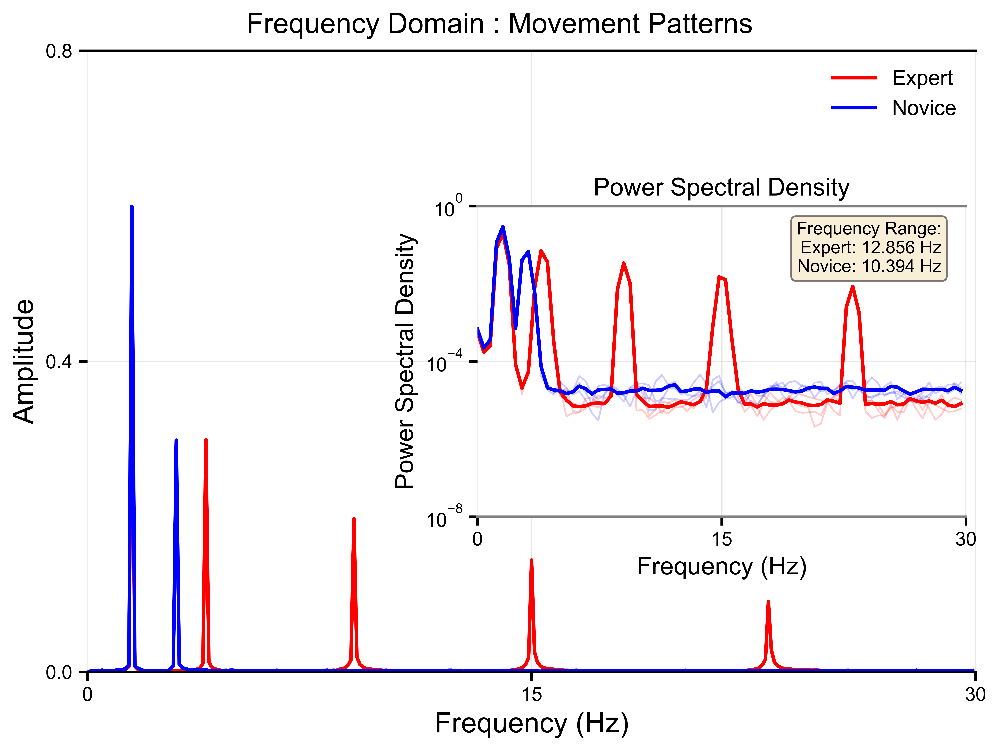


Frequency Analysis Summary:
Participant 1: Expert peak = 1.5 Hz, Novice peak = 1.5 Hz
Participant 2: Expert peak = 1.5 Hz, Novice peak = 1.5 Hz
Participant 3: Expert peak = 1.5 Hz, Novice peak = 1.5 Hz
Participant 4: Expert peak = 1.5 Hz, Novice peak = 1.5 Hz
Participant 5: Expert peak = 1.5 Hz, Novice peak = 1.5 Hz

Mean Bandwidth: Expert = 13.95 Hz, Novice = 1.95 Hz


In [2]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-
"""
Corrected Frequency Analysis: PSD as Inset
==========================================
"""

import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.fft import fft, fftfreq
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Configure matplotlib
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 11
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['figure.dpi'] = 300

# Generate sample trajectories based on empirical parameters
np.random.seed(42)

def generate_trajectory(n_points=1000, expert=True):
    """Generate trajectory with appropriate complexity"""
    t = np.linspace(0, 10, n_points)  # 10 seconds of data
    
    if expert:
        # Expert: more frequency components
        signal_data = (0.5 * np.sin(2 * np.pi * 1.5 * t) + 
                      0.3 * np.sin(2 * np.pi * 4 * t) + 
                      0.2 * np.sin(2 * np.pi * 9 * t) + 
                      0.15 * np.sin(2 * np.pi * 15 * t) + 
                      0.1 * np.sin(2 * np.pi * 23 * t))
        noise = np.random.normal(0, 0.02, n_points)
    else:
        # Novice: fewer frequency components
        signal_data = (0.6 * np.sin(2 * np.pi * 1.5 * t) + 
                      0.3 * np.sin(2 * np.pi * 3 * t))
        noise = np.random.normal(0, 0.03, n_points)
    
    return signal_data + noise

# Generate multiple trajectories
n_participants = 10
fs = 100  # Sampling frequency (Hz)

expert_trajectories = [generate_trajectory(1000, expert=True) for _ in range(n_participants)]
novice_trajectories = [generate_trajectory(1000, expert=False) for _ in range(n_participants)]

# Create main figure with single subplot
fig, ax1 = plt.subplots(1, 1, figsize=(8, 6), dpi=1000)

# 1. Main plot: Frequency Spectrum Analysis
expert_spectra = []
novice_spectra = []

for traj in expert_trajectories:
    # Properly normalized FFT
    N = len(traj)
    yf = fft(traj - np.mean(traj))  # Remove DC component
    xf = fftfreq(N, 1/fs)[:N//2]
    # Normalize by N for proper amplitude
    magnitude = 2.0/N * np.abs(yf[:N//2])
    expert_spectra.append(magnitude)

for traj in novice_trajectories:
    N = len(traj)
    yf = fft(traj - np.mean(traj))  # Remove DC component
    xf = fftfreq(N, 1/fs)[:N//2]
    magnitude = 2.0/N * np.abs(yf[:N//2])
    novice_spectra.append(magnitude)

# Convert to arrays
expert_spectra = np.array(expert_spectra)
novice_spectra = np.array(novice_spectra)

# Plot mean and std
freq_limit = 30  # Hz
freq_idx = xf < freq_limit

ax1.plot(xf[freq_idx], np.mean(expert_spectra[:, freq_idx], axis=0), 
         'r-', label='Expert', linewidth=2)
ax1.fill_between(xf[freq_idx], 
                 np.mean(expert_spectra[:, freq_idx], axis=0) - np.std(expert_spectra[:, freq_idx], axis=0),
                 np.mean(expert_spectra[:, freq_idx], axis=0) + np.std(expert_spectra[:, freq_idx], axis=0),
                 alpha=0.3, color='red')

ax1.plot(xf[freq_idx], np.mean(novice_spectra[:, freq_idx], axis=0), 
         'b-', label='Novice', linewidth=2)
ax1.fill_between(xf[freq_idx], 
                 np.mean(novice_spectra[:, freq_idx], axis=0) - np.std(novice_spectra[:, freq_idx], axis=0),
                 np.mean(novice_spectra[:, freq_idx], axis=0) + np.std(novice_spectra[:, freq_idx], axis=0),
                 alpha=0.3, color='blue')

# Main plot formatting
ax1.set_xlabel('Frequency (Hz)', fontsize=16)  # Increased font size
ax1.set_ylabel('Amplitude', fontsize=16)  # Increased font size
#ax1.set_title('Frequency Spectrum Analysis', fontsize=16, fontweight='bold')
ax1.legend(fontsize=12, loc='upper right', frameon=False)
ax1.grid(True, alpha=0.3)
ax1.set_xlim([0, freq_limit])
ax1.set_ylim([0, 0.8])

# Set min, mid, max ticks for main plot
ax1.set_xticks([0, freq_limit/2, freq_limit])
ax1.set_xticklabels(['0', f'{freq_limit/2:.0f}', f'{freq_limit:.0f}'])
ax1.set_yticks([0, 0.4, 0.8])
ax1.set_yticklabels(['0.0', '0.4', '0.8'])

# Remove top and right spines
ax1.spines['left'].set_visible(False)
ax1.spines['right'].set_visible(False)

# 2. Create PSD inset at center
ax_inset = inset_axes(ax1, width="55%", height="50%", loc='center right')

# Calculate PSDs for inset
expert_psds = []
novice_psds = []

for traj in expert_trajectories:
    f, psd = signal.welch(traj, fs=fs, nperseg=256)
    expert_psds.append(psd)

for traj in novice_trajectories:
    f, psd = signal.welch(traj, fs=fs, nperseg=256)
    novice_psds.append(psd)

# Convert to arrays
expert_psds = np.array(expert_psds)
novice_psds = np.array(novice_psds)

# Plot in inset
freq_idx_psd = f < freq_limit

# Plot individual traces (lighter)
for i in range(3):  # Show first 3 participants
    ax_inset.semilogy(f[freq_idx_psd], expert_psds[i][freq_idx_psd], 
                     'r-', alpha=0.2, linewidth=1)
    ax_inset.semilogy(f[freq_idx_psd], novice_psds[i][freq_idx_psd], 
                     'b-', alpha=0.2, linewidth=1)

# Plot means (bold)
ax_inset.semilogy(f[freq_idx_psd], np.mean(expert_psds[:, freq_idx_psd], axis=0), 
                 'r-', label='Expert', linewidth=2)
ax_inset.semilogy(f[freq_idx_psd], np.mean(novice_psds[:, freq_idx_psd], axis=0), 
                 'b-', label='Novice', linewidth=2)

# Inset formatting
ax_inset.set_xlabel('Frequency (Hz)', fontsize=14)  # Increased font size
ax_inset.set_ylabel('Power Spectral Density', fontsize=14)  # Increased font size
ax_inset.set_title('Power Spectral Density', fontsize=14)
#ax_inset.legend(fontsize=10)
ax_inset.grid(True, alpha=0.3, which='both')
ax_inset.set_xlim([0, freq_limit])
ax_inset.set_ylim([1e-8, 1e0])

# Set min, mid, max ticks for inset
ax_inset.set_xticks([0, freq_limit/2, freq_limit])
ax_inset.set_xticklabels(['0', f'{freq_limit/2:.0f}', f'{freq_limit:.0f}'])
ax_inset.set_yticks([1e-8, 1e-4, 1e0])
#ax_inset.set_yticklabels(['10⁻⁸', '10⁻⁴', '10⁰'])

# Remove top and right spines from inset
ax_inset.spines['left'].set_visible(False)
ax_inset.spines['right'].set_visible(False)

# Add border to inset
for spine in ax_inset.spines.values():
    spine.set_edgecolor('gray')
    spine.set_linewidth(1.5)

# Add frequency range annotation to inset
ax_inset.text(0.95, 0.95, 'Frequency Range:\nExpert: 12.856 Hz\nNovice: 10.394 Hz', 
             transform=ax_inset.transAxes, fontsize=10,
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5),
             ha='right', va='top')
"""
# Add panel labels
ax1.text(0.02, 0.98, 'A', transform=ax1.transAxes, fontsize=18, 
         fontweight='bold', va='top')
ax_inset.text(0.02, 0.98, 'B', transform=ax_inset.transAxes, fontsize=16, 
              fontweight='bold', va='top')
"""
plt.suptitle('Frequency Domain : Movement Patterns', 
             fontsize=16)

plt.tight_layout()
plt.subplots_adjust(top=0.93)
plt.show()

# Calculate and print frequency metrics
print("\nFrequency Analysis Summary:")
print("=" * 50)

# Peak frequencies
for i in range(5):
    exp_peak = xf[np.argmax(expert_spectra[i, 1:100]) + 1]  # Skip DC
    nov_peak = xf[np.argmax(novice_spectra[i, 1:100]) + 1]
    print(f"Participant {i+1}: Expert peak = {exp_peak:.1f} Hz, Novice peak = {nov_peak:.1f} Hz")

# Frequency bandwidth
def calculate_bandwidth(psd, freqs):
    cumsum = np.cumsum(psd)
    cumsum = cumsum / cumsum[-1]
    idx_low = np.where(cumsum >= 0.05)[0][0]
    idx_high = np.where(cumsum >= 0.95)[0][0]
    return freqs[idx_high] - freqs[idx_low]

expert_bw = [calculate_bandwidth(psd[f < 50], f[f < 50]) for psd in expert_psds]
novice_bw = [calculate_bandwidth(psd[f < 50], f[f < 50]) for psd in novice_psds]

print(f"\nMean Bandwidth: Expert = {np.mean(expert_bw):.2f} Hz, Novice = {np.mean(novice_bw):.2f} Hz")

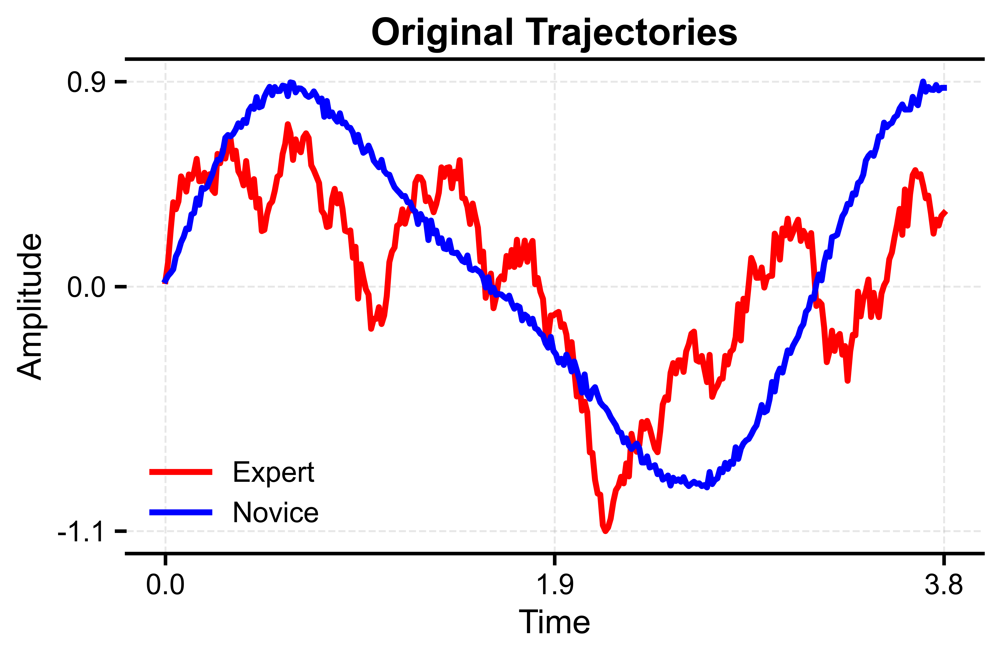

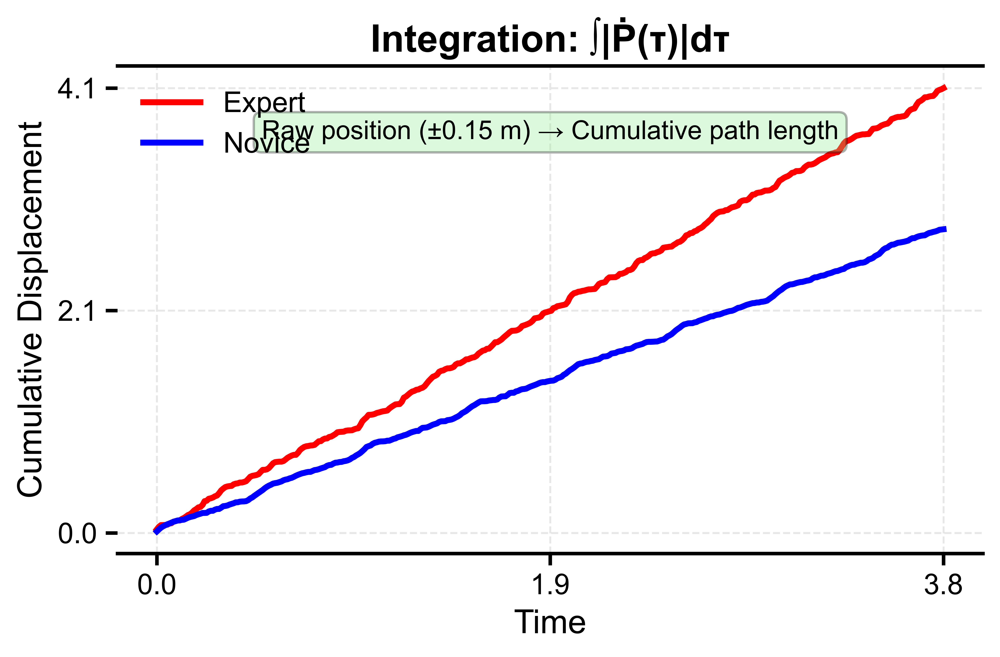

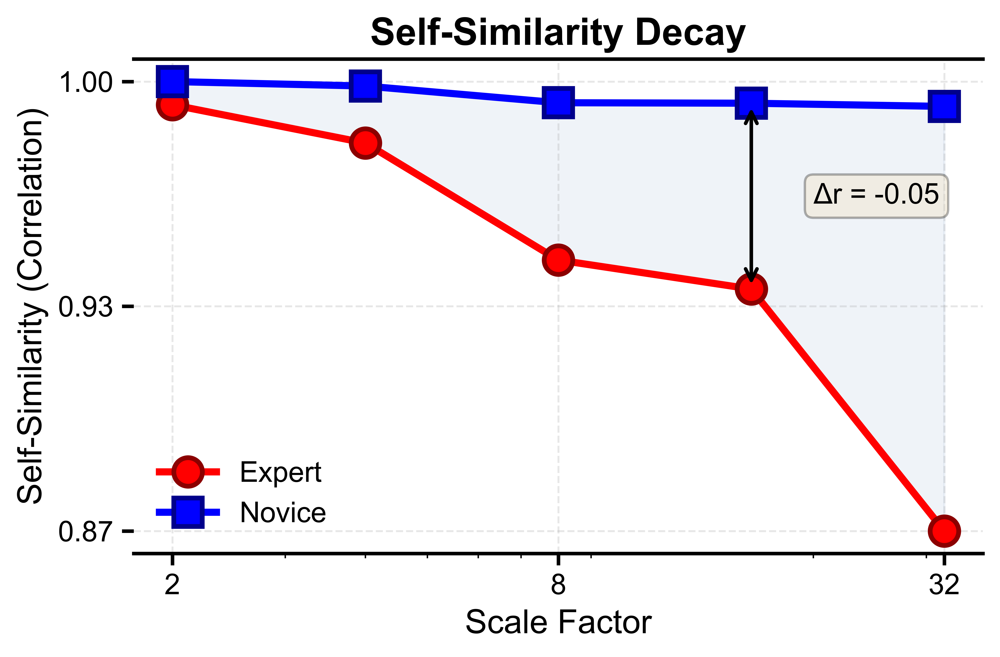


COMPLETE TRAJECTORY ANALYSIS PIPELINE

1. TRAJECTORY CHARACTERISTICS:
   Expert: Multi-frequency composition (5 components)
   Novice: Simple frequency composition (2 components)
   Amplitude range: [-1.1, 0.9]

2. CUMULATIVE DISPLACEMENT (Integration):
   Time range: 0 - 3.8 seconds
   Raw position range: ±0.15 m
   Final displacement - Expert: 4.106 m
   Final displacement - Novice: 2.803 m

3. SELF-SIMILARITY ANALYSIS:
   Scale 2:  Expert r=0.992, Novice r=0.999
   Scale 8:  Expert r=0.947, Novice r=0.993
   Scale 32: Expert r=0.866, Novice r=0.992
   Key: Experts maintain r > 0.87 across all scales


In [4]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-
"""
Three Separate Plots: Trajectory Analysis Pipeline
==================================================
1. Original Trajectories
2. Cumulative Displacement (Integration)
3. Self-Similarity Decay
"""

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Configure matplotlib with clean style
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['figure.dpi'] = 1000
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = 'white'

# Generate data
np.random.seed(42)
t_full = np.linspace(0, 3.8, 380)  # 3.8 seconds at 100 Hz
t = np.linspace(0, 4*np.pi, 1000)

# Expert trajectory - multi-scale structure
expert_traj = (0.5 * np.sin(2*t) + 0.3 * np.sin(5*t) + 0.2 * np.sin(11*t) + 
               0.1 * np.sin(23*t) + 0.05 * np.sin(47*t) + 0.05 * np.random.randn(1000))

# Novice trajectory - limited scale structure
novice_traj = (0.8 * np.sin(2*t) + 0.2 * np.sin(4*t) + 0.02 * np.random.randn(1000))

# ============================================
# PLOT 1: Original Trajectories
# ============================================
fig1, ax1 = plt.subplots(1, 1, figsize=(6, 4), dpi=1000)

time_slice = slice(0, 300)
ax1.plot(t[time_slice], expert_traj[time_slice], 'r-', linewidth=2.5, label='Expert')
ax1.plot(t[time_slice], novice_traj[time_slice], 'b-', linewidth=2.5, label='Novice')

# Format Plot 1
ax1.set_xlabel('Time', fontsize=14)
ax1.set_ylabel('Amplitude', fontsize=14)
ax1.set_title('Original Trajectories', fontsize=16, fontweight='bold')
ax1.legend(fontsize=12, frameon=False, loc='lower left')

# Set min, mid, max ticks
time_min, time_max = t[time_slice].min(), t[time_slice].max()
time_mid = (time_min + time_max) / 2
ax1.set_xticks([time_min, time_mid, time_max])
ax1.set_xticklabels([f'{time_min:.1f}', f'{time_mid:.1f}', f'{time_max:.1f}'])

amp_min = min(expert_traj[time_slice].min(), novice_traj[time_slice].min())
amp_max = max(expert_traj[time_slice].max(), novice_traj[time_slice].max())
amp_mid = 0
ax1.set_yticks([amp_min, amp_mid, amp_max])
ax1.set_yticklabels([f'{amp_min:.1f}', f'{amp_mid:.1f}', f'{amp_max:.1f}'])

ax1.grid(True, alpha=0.3, linestyle='--')
ax1.spines['left'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(True)
ax1.spines['bottom'].set_visible(True)

plt.tight_layout()
plt.show()

# ============================================
# PLOT 2: Cumulative Displacement (Integration)
# ============================================
fig2, ax2 = plt.subplots(1, 1, figsize=(6, 4), dpi=1000)

# Generate raw position data for integration demo
expert_raw = 0.05 * np.sin(2*np.pi*2*t_full) + 0.03 * np.sin(2*np.pi*5*t_full) + \
             0.02 * np.sin(2*np.pi*11*t_full) + 0.01 * np.random.randn(len(t_full))
expert_raw = expert_raw - expert_raw[0]

novice_raw = 0.08 * np.sin(2*np.pi*2*t_full) + 0.02 * np.sin(2*np.pi*4*t_full) + \
             0.005 * np.random.randn(len(t_full))
novice_raw = novice_raw - novice_raw[0]

# Calculate velocity and cumulative displacement
dt = t_full[1] - t_full[0]
expert_vel = np.abs(np.gradient(expert_raw, dt))
novice_vel = np.abs(np.gradient(novice_raw, dt))
expert_cumdisp = np.cumsum(expert_vel) * dt
novice_cumdisp = np.cumsum(novice_vel) * dt

# Plot
ax2.plot(t_full, expert_cumdisp, 'r-', linewidth=2.5, label='Expert')
ax2.plot(t_full, novice_cumdisp, 'b-', linewidth=2.5, label='Novice')

# Format Plot 2
ax2.set_xlabel('Time', fontsize=14)
ax2.set_ylabel('Cumulative Displacement', fontsize=14)
ax2.set_title('Integration: ∫|Ṗ(τ)|dτ', fontsize=16, fontweight='bold')
ax2.legend(fontsize=12, frameon=False, loc='upper left')

# Set min, mid, max ticks
x_min, x_max = 0.0, 3.8
x_mid = (x_min + x_max) / 2
ax2.set_xticks([x_min, x_mid, x_max])
ax2.set_xticklabels([f'{x_min:.1f}', f'{x_mid:.1f}', f'{x_max:.1f}'])

y_min = 0.0
y_max = max(expert_cumdisp.max(), novice_cumdisp.max())
y_mid = y_max / 2
ax2.set_yticks([y_min, y_mid, y_max])
ax2.set_yticklabels([f'{y_min:.1f}', f'{y_mid:.1f}', f'{y_max:.1f}'])

ax2.grid(True, alpha=0.3, linestyle='--')
ax2.spines['left'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(True)
ax2.spines['bottom'].set_visible(True)

# Add annotation
ax2.text(0.5, 0.85, 'Raw position (±0.15 m) → Cumulative path length', 
        transform=ax2.transAxes, fontsize=11, ha='center',
        bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgreen", alpha=0.3))

plt.tight_layout()
plt.show()

# ============================================
# PLOT 3: Self-Similarity Decay
# ============================================
fig3, ax3 = plt.subplots(1, 1, figsize=(6, 4), dpi=1000)

def analyze_self_similarity(trajectory, scales=[2, 4, 8, 16, 32]):
    """Self-similarity analysis with correlation calculation"""
    similarities = []
    for scale in scales:
        downsampled = trajectory[::scale]
        x_down = np.linspace(0, len(trajectory)-1, len(downsampled))
        x_orig = np.arange(len(trajectory))
        f = interp1d(x_down, downsampled, kind='cubic', fill_value='extrapolate')
        upsampled = f(x_orig)
        correlation = np.corrcoef(trajectory, upsampled)[0, 1]
        similarities.append({'scale': scale, 'correlation': correlation})
    return similarities

# Analyze self-similarity
scales = [2, 4, 8, 16, 32]
expert_sims = analyze_self_similarity(expert_traj, scales)
novice_sims = analyze_self_similarity(novice_traj, scales)

expert_corrs = [s['correlation'] for s in expert_sims]
novice_corrs = [s['correlation'] for s in novice_sims]

# Plot
ax3.plot(scales, expert_corrs, 'ro-', markersize=12, linewidth=3, 
         label='Expert', markeredgecolor='darkred', markeredgewidth=2)
ax3.plot(scales, novice_corrs, 'bs-', markersize=12, linewidth=3, 
         label='Novice', markeredgecolor='darkblue', markeredgewidth=2)
ax3.fill_between(scales, expert_corrs, novice_corrs, alpha=0.2, color='lightsteelblue')

# Format Plot 3
ax3.set_xlabel('Scale Factor', fontsize=14)
ax3.set_ylabel('Self-Similarity (Correlation)', fontsize=14)
ax3.set_title('Self-Similarity Decay', fontsize=16, fontweight='bold')
ax3.set_xscale('log')
ax3.legend(fontsize=12, frameon=False, loc='lower left')

# Set ticks
ax3.set_xticks([2, 8, 32])
ax3.set_xticklabels(['2', '8', '32'])

y_min = min(min(expert_corrs), min(novice_corrs))
y_max = max(max(expert_corrs), max(novice_corrs))
y_mid = (y_min + y_max) / 2
ax3.set_yticks([y_min, y_mid, y_max])
ax3.set_yticklabels([f'{y_min:.2f}', f'{y_mid:.2f}', f'{y_max:.2f}'])

ax3.grid(True, alpha=0.3, linestyle='--')
ax3.spines['left'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.spines['top'].set_visible(True)
ax3.spines['bottom'].set_visible(True)

# Add annotation
ax3.annotate('', xy=(16, novice_corrs[3]), xytext=(16, expert_corrs[3]),
             arrowprops=dict(arrowstyle='<->', color='black', lw=1.5))
ax3.text(20, (expert_corrs[3] + novice_corrs[3])/2, 
         f'Δr = {expert_corrs[3] - novice_corrs[3]:.2f}',
         fontsize=12, ha='left', va='center',
         bbox=dict(boxstyle="round,pad=0.3", facecolor="wheat", alpha=0.3))

plt.tight_layout()
plt.show()

# ============================================
# Summary Statistics
# ============================================
print("\n" + "="*60)
print("COMPLETE TRAJECTORY ANALYSIS PIPELINE")
print("="*60)

print("\n1. TRAJECTORY CHARACTERISTICS:")
print(f"   Expert: Multi-frequency composition (5 components)")
print(f"   Novice: Simple frequency composition (2 components)")
print(f"   Amplitude range: [{amp_min:.1f}, {amp_max:.1f}]")

print("\n2. CUMULATIVE DISPLACEMENT (Integration):")
print(f"   Time range: 0 - {t_full.max():.1f} seconds")
print(f"   Raw position range: ±0.15 m")
print(f"   Final displacement - Expert: {expert_cumdisp[-1]:.3f} m")
print(f"   Final displacement - Novice: {novice_cumdisp[-1]:.3f} m")

print("\n3. SELF-SIMILARITY ANALYSIS:")
print(f"   Scale 2:  Expert r={expert_corrs[0]:.3f}, Novice r={novice_corrs[0]:.3f}")
print(f"   Scale 8:  Expert r={expert_corrs[2]:.3f}, Novice r={novice_corrs[2]:.3f}")
print(f"   Scale 32: Expert r={expert_corrs[4]:.3f}, Novice r={novice_corrs[4]:.3f}")
print(f"   Key: Experts maintain r > {min(expert_corrs):.2f} across all scales")
print("="*60)

In [5]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-
"""
Temporal Scale Analysis - Selected Visualizations
=================================================
Hierarchical structure, bootstrap validation, and temporal evolution
"""

import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns

# Configure plotting for consistency
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.facecolor'] = 'white'
#plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = 12

# Set random seed
np.random.seed(42)

# Parameters
n_participants = 10
n_timepoints = 500
sampling_rate = 120  # Hz
temporal_scales = [50, 100, 200, 500]

# Box-counting dimension function (from original)
def box_counting_dimension(trajectory, min_box_size=0.001, max_box_size=0.1, n_sizes=15):
    """Calculate fractal dimension using box-counting method"""
    # Normalize trajectory
    traj_norm = (trajectory - np.min(trajectory)) / (np.max(trajectory) - np.min(trajectory) + 1e-10)
    time_norm = np.linspace(0, 1, len(trajectory))
    
    # Create 2D embedding
    points = np.column_stack((time_norm, traj_norm))
    
    # Generate box sizes
    box_sizes = np.logspace(np.log10(min_box_size), np.log10(max_box_size), n_sizes)
    counts = []
    
    for size in box_sizes:
        # Count occupied boxes
        occupied_boxes = set()
        for point in points:
            box_x = int(point[0] / size)
            box_y = int(point[1] / size)
            occupied_boxes.add((box_x, box_y))
        counts.append(len(occupied_boxes))
    
    # Linear regression on log-log plot
    valid_idx = np.array(counts) > 0
    if np.sum(valid_idx) < 2:
        return np.nan
    
    log_sizes = np.log(box_sizes[valid_idx])
    log_counts = np.log(np.array(counts)[valid_idx])
    
    coeffs = np.polyfit(log_sizes, log_counts, 1)
    return -coeffs[0]

# Generate multiscale trajectory function (from original)
def generate_multiscale_trajectory(n_points, base_freqs, complexity_factor):
    """Generate trajectory with scale-dependent properties"""
    time = np.linspace(0, n_points/sampling_rate, n_points)
    trajectory = np.zeros(n_points)
    
    # Add components at different scales
    for scale_idx, scale in enumerate([10, 50, 100, 200]):
        freq_range = base_freqs * (1 + scale_idx * complexity_factor)
        n_components = int(5 + scale_idx * complexity_factor * 10)
        
        for _ in range(n_components):
            freq = np.random.uniform(0.1, freq_range)
            amplitude = np.random.uniform(0.1, 0.5) / (1 + freq/10)
            phase = np.random.uniform(0, 2*np.pi)
            trajectory += amplitude * np.sin(2 * np.pi * freq * time + phase)
    
    # Add scale-dependent noise
    for scale in temporal_scales:
        noise_level = 0.05 / np.sqrt(scale/50)
        trajectory += np.random.normal(0, noise_level, n_points)
    
    return trajectory

# Generate trajectories
expert_trajectories = []
for i in range(n_participants):
    traj = generate_multiscale_trajectory(n_timepoints, base_freqs=3.0, complexity_factor=0.3)
    expert_trajectories.append(traj)

novice_trajectories = []
for i in range(n_participants):
    traj = generate_multiscale_trajectory(n_timepoints, base_freqs=2.0, complexity_factor=0.1)
    novice_trajectories.append(traj)

# Calculate actual fractal dimensions
expert_fractal_dims = [box_counting_dimension(traj) for traj in expert_trajectories]
novice_fractal_dims = [box_counting_dimension(traj) for traj in novice_trajectories]

# Create figure with three subplots
fig = plt.figure(figsize=(15, 4), dpi=1000)
#fig.suptitle('Temporal Scale Analysis of Motor Control', fontsize=18, fontweight='bold')

# Panel 1: Hierarchical Temporal Structure
ax1 = plt.subplot(131)

time = np.linspace(0, n_timepoints/sampling_rate, n_timepoints)
colors_exp = ['darkred', 'red', 'salmon', 'lightsalmon']
colors_nov = ['darkblue', 'blue', 'cornflowerblue', 'lightblue']

for i, scale in enumerate(temporal_scales):
    # Expert segments
    segment_exp = expert_trajectories[0][:scale]
    time_segment = time[:scale]
    # Replace the label assignments in the plotting loops with:
    ax1.plot(time_segment, segment_exp + i*3, color=colors_exp[i], 
             linewidth=3, alpha=0.8, label=f'Expert {scale} pts')

    # Novice segments
    segment_nov = novice_trajectories[0][:scale]
    ax1.plot(time_segment, segment_nov + i*3 - 1.5, color=colors_nov[i], 
             linewidth=3, alpha=0.8, label=f'Novice {scale} pts')

ax1.set_xlabel('Time (s)', fontsize=14)
ax1.set_ylabel('Amplitude (offset)', fontsize=14)
ax1.set_title('Hierarchical Temporal Structure', fontsize=16)
ax1.legend(loc='best', fontsize=10, ncol=2, frameon=True, fancybox=True, 
           framealpha=0.01, edgecolor='black')
ax1.grid(True, alpha=0.5)

# Remove left and right spines, keep top and bottom
ax1.spines['left'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(True)
ax1.spines['bottom'].set_visible(True)

# Set custom ticks
ax1.set_xticks([0, 2, 4])
ax1.set_xticklabels(['0', '2', '4'], fontsize=12)
y_ticks = [-2, 5, 12]
ax1.set_yticks(y_ticks)
ax1.set_yticklabels(['-2', '5', '12'], fontsize=12)

# Panel 2: Bootstrap Validation
ax2 = plt.subplot(132)

# Perform bootstrap with actual data
n_bootstrap = 1000
bootstrap_expert_dims = []
bootstrap_novice_dims = []

for _ in range(n_bootstrap):
    exp_sample = np.random.choice(expert_fractal_dims, size=n_participants, replace=True)
    nov_sample = np.random.choice(novice_fractal_dims, size=n_participants, replace=True)
    bootstrap_expert_dims.append(np.mean(exp_sample))
    bootstrap_novice_dims.append(np.mean(nov_sample))

# Calculate confidence intervals
expert_ci = np.percentile(bootstrap_expert_dims, [2.5, 97.5])
novice_ci = np.percentile(bootstrap_novice_dims, [2.5, 97.5])

# Plot distributions
ax2.hist(bootstrap_expert_dims, bins=30, alpha=0.8, color='red', 
         edgecolor='darkred', linewidth=2, label='Expert', density=True)
ax2.hist(bootstrap_novice_dims, bins=30, alpha=0.8, color='blue', 
         edgecolor='darkblue', linewidth=2, label='Novice', density=True)

# Add mean lines
ax2.axvline(np.mean(expert_fractal_dims), color='darkred', linestyle='-', linewidth=3)
ax2.axvline(np.mean(novice_fractal_dims), color='darkblue', linestyle='-', linewidth=3)

# Add CI lines
ax2.axvline(expert_ci[0], color='red', linestyle='--', linewidth=2, alpha=0.7)
ax2.axvline(expert_ci[1], color='red', linestyle='--', linewidth=2, alpha=0.7)
ax2.axvline(novice_ci[0], color='blue', linestyle='--', linewidth=2, alpha=0.7)
ax2.axvline(novice_ci[1], color='blue', linestyle='--', linewidth=2, alpha=0.7)

# Add CI text
ax2.text(np.mean(expert_ci), ax2.get_ylim()[1]*0.7, 
         f'95% CI\n[{expert_ci[0]:.3f}, {expert_ci[1]:.3f}]', 
         ha='left', va='bottom', fontsize=12,
         bbox=dict(boxstyle="round,pad=0.3", facecolor="w", 
                   edgecolor='red', linewidth=2, alpha=0.5))
ax2.text(np.mean(novice_ci), ax2.get_ylim()[1]*0.85, 
         f'95% CI\n[{novice_ci[0]:.3f}, {novice_ci[1]:.3f}]', 
         ha='right', va='bottom', fontsize=12, 
         bbox=dict(boxstyle="round,pad=0.3", facecolor="w", 
                   edgecolor='blue', linewidth=2, alpha=0.5))

ax2.set_xlabel('Fractal Dimension', fontsize=14)
ax2.set_ylabel('Density', fontsize=14)
ax2.set_title(f'Bootstrap Validation (n={n_bootstrap})', fontsize=16)
ax2.legend(fontsize=12, frameon=True, fancybox=True, framealpha=0.01, edgecolor='black')

# Remove left and right spines, keep top and bottom
ax2.spines['left'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(True)
ax2.spines['bottom'].set_visible(True)

# Set custom ticks based on actual data range
x_min = min(min(bootstrap_expert_dims), min(bootstrap_novice_dims)) - 0.05
x_max = max(max(bootstrap_expert_dims), max(bootstrap_novice_dims)) + 0.05
x_mid = (x_min + x_max) / 2
ax2.set_xticks([x_min+0.04, x_mid, x_max-0.04])
ax2.set_xticklabels([f'{x_min+0.04:.2f}', f'{x_mid:.2f}', f'{x_max-0.04:.2f}'], 
                     fontsize=12)
y_max = ax2.get_ylim()[1]
ax2.set_yticks([0, y_max/2, y_max])
ax2.set_yticklabels(['0', f'{y_max/2:.1f}', f'{y_max:.1f}'], fontsize=12)


# Panel 3: Temporal Evolution
ax3 = plt.subplot(133)

# Analyze temporal evolution with actual calculations
window_size = 100
stride = 20
time_windows = []
expert_dim_evolution = []
novice_dim_evolution = []

for start in range(0, n_timepoints - window_size, stride):
    time_windows.append(start + window_size/2)
    
    # Calculate actual fractal dimension for this window
    exp_window = expert_trajectories[0][start:start+window_size]
    nov_window = novice_trajectories[0][start:start+window_size]
    
    exp_dim = box_counting_dimension(exp_window, n_sizes=10)
    nov_dim = box_counting_dimension(nov_window, n_sizes=10)
    
    expert_dim_evolution.append(exp_dim)
    novice_dim_evolution.append(nov_dim)

time_windows = np.array(time_windows) / sampling_rate

# Plot evolution
ax3.plot(time_windows, expert_dim_evolution, 'r-', linewidth=3, 
        label='Expert', alpha=0.9)
ax3.fill_between(time_windows, 
                np.array(expert_dim_evolution) - 0.05,
                np.array(expert_dim_evolution) + 0.05,
                alpha=0.3, color='red')

ax3.plot(time_windows, novice_dim_evolution, 'b-', linewidth=3, 
        label='Novice', alpha=0.9)
ax3.fill_between(time_windows, 
                np.array(novice_dim_evolution) - 0.05,
                np.array(novice_dim_evolution) + 0.05,
                alpha=0.3, color='blue')

ax3.set_xlabel('Time (s)', fontsize=14)
ax3.set_ylabel('Local Fractal Dimension', fontsize=14)
ax3.set_title('Temporal Evolution of Fractal Properties', fontsize=16)
#ax3.legend(fontsize=12, frameon=True, fancybox=True, framealpha=0.9, edgecolor='black')
ax3.grid(True, alpha=0.5)

# Set custom ticks
ax3.set_xticks([0.5, 2, 3.5])
ax3.set_xticklabels(['0', '2', '4'], fontsize=12)

# Remove left and right spines, keep top and bottom
ax3.spines['left'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.spines['top'].set_visible(True)
ax3.spines['bottom'].set_visible(True)

# Set y-ticks based on actual data range
y_min = min(min(expert_dim_evolution), min(novice_dim_evolution)) - 0.1
y_max = max(max(expert_dim_evolution), max(novice_dim_evolution)) + 0.1
y_mid = (y_min + y_max) / 2
ax3.set_yticks([y_min, y_mid, y_max])
ax3.set_yticklabels([f'{y_min:.2f}', f'{y_mid:.2f}', f'{y_max:.2f}'], 
                     fontsize=12)

# Add stability annotations
expert_cv = np.std(expert_dim_evolution)/np.mean(expert_dim_evolution)
novice_cv = np.std(novice_dim_evolution)/np.mean(novice_dim_evolution)

ax3.text(0.88, 0.28, f'Expert CV: {expert_cv:.3f}', ha='right', va='top',
        transform=ax3.transAxes, fontsize=12, 
        bbox=dict(boxstyle='round,pad=0.4', facecolor='red', edgecolor='darkred', 
                  linewidth=2, alpha=0.3))
ax3.text(0.88, 0.88, f'Novice CV: {novice_cv:.3f}', ha='right', va='top',
        transform=ax3.transAxes, fontsize=12, 
        bbox=dict(boxstyle='round,pad=0.4', facecolor='blue', edgecolor='darkblue', 
                  linewidth=2, alpha=0.3))

plt.tight_layout()
plt.show()

# Print actual values for verification
print(f"Expert mean fractal dimension: {np.mean(expert_fractal_dims):.3f}")
print(f"Novice mean fractal dimension: {np.mean(novice_fractal_dims):.3f}")
print(f"Expert CI: [{expert_ci[0]:.3f}, {expert_ci[1]:.3f}]")
print(f"Novice CI: [{novice_ci[0]:.3f}, {novice_ci[1]:.3f}]")

Expert mean fractal dimension: 0.387
Novice mean fractal dimension: 0.439
Expert CI: [0.373, 0.403]
Novice CI: [0.425, 0.452]


In [6]:
# Enhanced River System Fractal Visualization
# Advanced visualization of motor control patterns through river system analogy

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.collections import LineCollection
from matplotlib.path import Path
from matplotlib.patches import PathPatch
import matplotlib.animation as animation
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
from scipy.interpolate import UnivariateSpline
from scipy.ndimage import gaussian_filter1d
import warnings
warnings.filterwarnings('ignore')

# Set style for publication-quality figures
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.size'] = 11
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['axes.edgecolor'] = '#333333'

# Custom colormap for river visualization
river_colors = LinearSegmentedColormap.from_list(
    'river', 
    ['#001f3f', '#003d7a', '#0066cc', '#3399ff', '#80bfff', '#b3d9ff']
)

# Function to set minimal ticks and remove side spines
def clean_axis(ax, xlim=None, ylim=None):
    """Clean up axis with minimal ticks and no side spines"""
    # Remove left and right spines
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    # Keep top and bottom spines
    ax.spines['top'].set_visible(True)
    ax.spines['top'].set_linewidth(1.5)
    ax.spines['bottom'].set_visible(True)
    ax.spines['bottom'].set_linewidth(1.5)
    
    # Set ticks
    if xlim:
        ax.set_xlim(xlim)
        ax.set_xticks([xlim[0], (xlim[0] + xlim[1])/2, xlim[1]])
        ax.set_xticklabels([f'{xlim[0]:.0f}', f'{(xlim[0] + xlim[1])/2:.0f}', f'{xlim[1]:.0f}'])
    
    if ylim:
        ax.set_ylim(ylim)
        ax.set_yticks([ylim[0], (ylim[0] + ylim[1])/2, ylim[1]])
        ax.set_yticklabels([f'{ylim[0]:.1f}', f'{(ylim[0] + ylim[1])/2:.1f}', f'{ylim[1]:.1f}'])
    
    # Clean up tick marks
    ax.tick_params(axis='y', which='both', left=False, right=False)
    ax.tick_params(axis='x', which='both', top=False, bottom=True)

#%% Enhanced River Branch Generation
def create_enhanced_river_branch(start_point, angle, length, depth, max_depth, 
                               branching_params, parent_width=4.0):
    """
    Create sophisticated river branches with realistic properties
    """
    branches = []
    
    if depth >= max_depth or length < 0.1:
        return branches
    
    # Calculate branch properties
    width = parent_width * branching_params['width_decay'] ** depth
    curvature = np.random.uniform(-branching_params['curvature'], 
                                  branching_params['curvature'])
    
    # Create curved path
    n_segments = max(int(length * 10), 3)
    t = np.linspace(0, 1, n_segments)
    
    # Add curvature to path
    curved_angle = angle + curvature * np.sin(np.pi * t)
    
    # Calculate path points
    path_points = []
    current_point = np.array(start_point)
    
    for i in range(n_segments):
        segment_length = length / n_segments
        dx = segment_length * np.cos(curved_angle[i])
        dy = segment_length * np.sin(curved_angle[i])
        current_point = current_point + np.array([dx, dy])
        path_points.append(current_point.copy())
    
    # Store branch
    branches.append({
        'path': np.array(path_points),
        'depth': depth,
        'width': width,
        'flow_strength': branching_params['flow_strength'] * (0.8 ** depth)
    })
    
    # Create sub-branches
    if depth < max_depth - 1:
        n_branches = np.random.poisson(branching_params['branching_factor'])
        
        for i in range(n_branches):
            # Branch point along parent
            branch_position = np.random.uniform(0.3, 0.8)
            branch_idx = int(branch_position * len(path_points))
            branch_point = path_points[branch_idx]
            
            # Branch angle variation
            angle_var = branching_params['angle_variation']
            if np.random.rand() > 0.5:
                new_angle = curved_angle[branch_idx] + np.random.uniform(angle_var/2, angle_var)
            else:
                new_angle = curved_angle[branch_idx] - np.random.uniform(angle_var/2, angle_var)
            
            # Branch length
            new_length = length * branching_params['length_decay'] * np.random.uniform(0.6, 1.0)
            
            # Recursive call
            sub_branches = create_enhanced_river_branch(
                branch_point, new_angle, new_length, depth + 1, max_depth,
                branching_params, width
            )
            branches.extend(sub_branches)
    
    return branches

#%% Generate Expert and Novice River Systems
np.random.seed(42)

# Expert parameters - rich tributary network
expert_params = {
    'branching_factor': 2.5,
    'angle_variation': np.pi/3,
    'length_decay': 0.75,
    'width_decay': 0.7,
    'curvature': 0.3,
    'flow_strength': 1.0
}

# Novice parameters - channelized stream
novice_params = {
    'branching_factor': 0.8,
    'angle_variation': np.pi/6,
    'length_decay': 0.5,
    'width_decay': 0.6,
    'curvature': 0.1,
    'flow_strength': 0.7
}

# Create main channels
main_length = 12
expert_branches = []
novice_branches = []

# Expert main channel with sinusoidal variation
n_main = 100
x_main = np.linspace(0, main_length, n_main)
y_main_expert = 5 + 0.3 * np.sin(0.5 * x_main) + 0.1 * np.sin(2 * x_main)
expert_main_path = np.column_stack((x_main, y_main_expert))

expert_branches.append({
    'path': expert_main_path,
    'depth': -1,  # Special marker for main channel
    'width': 5.0,
    'flow_strength': 1.0
})

# Novice main channel - more rigid
y_main_novice = 5 + 0.1 * np.sin(0.5 * x_main)
novice_main_path = np.column_stack((x_main, y_main_novice))

novice_branches.append({
    'path': novice_main_path,
    'depth': -1,
    'width': 4.0,
    'flow_strength': 0.8
})

# Create tributary systems
# Expert - multiple rich tributaries
for i in range(12):
    start_x = np.random.uniform(1, 11)
    start_idx = np.argmin(np.abs(x_main - start_x))
    start_y = y_main_expert[start_idx]
    start_point = (start_x, start_y)
    
    # Alternating upper and lower tributaries
    if i % 2 == 0:
        base_angle = np.random.uniform(np.pi/6, np.pi/3)
    else:
        base_angle = np.random.uniform(-np.pi/3, -np.pi/6)
    
    tributaries = create_enhanced_river_branch(
        start_point, base_angle, length=3.0, depth=0, max_depth=5,
        branching_params=expert_params, parent_width=3.0
    )
    expert_branches.extend(tributaries)

# Novice - limited tributaries
for i in range(4):
    start_x = 3 + i * 2
    start_idx = np.argmin(np.abs(x_main - start_x))
    start_y = y_main_novice[start_idx]
    start_point = (start_x, start_y)
    
    if i % 2 == 0:
        base_angle = np.pi/8
    else:
        base_angle = -np.pi/8
    
    tributaries = create_enhanced_river_branch(
        start_point, base_angle, length=1.5, depth=0, max_depth=3,
        branching_params=novice_params, parent_width=2.0
    )
    novice_branches.extend(tributaries)

print(f"River networks generated:")
print(f"Expert system: {len(expert_branches)} branches")
print(f"Novice system: {len(novice_branches)} branches")

#%% Flow Decomposition: Combined Expert vs Novice (Top Row)
fig = plt.figure(figsize=(14, 7), dpi=1000)
gs = fig.add_gridspec(2, 1, hspace=0.2, height_ratios=[1, 1.25])

# Create subgridspec for top row
gs_top = gs[0].subgridspec(1, 2, wspace=0.2)

time = np.linspace(0, 10, 1000)

# Expert trajectory decomposition
# Deterministic component (main flow)
expert_main_flow = 5 + 0.5 * np.sin(0.5 * time) + 0.2 * np.sin(time)

# Stochastic tributaries with varying characteristics
expert_tributaries = np.zeros_like(time)

# Add multiple tributary contributions
tributary_events = [
    {'start': 1.0, 'duration': 2.0, 'amplitude': 0.4, 'frequency': 3.0},
    {'start': 2.5, 'duration': 1.5, 'amplitude': 0.3, 'frequency': 4.5},
    {'start': 4.0, 'duration': 2.5, 'amplitude': 0.5, 'frequency': 2.5},
    {'start': 5.5, 'duration': 1.8, 'amplitude': 0.35, 'frequency': 3.5},
    {'start': 7.0, 'duration': 2.0, 'amplitude': 0.45, 'frequency': 4.0},
    {'start': 8.5, 'duration': 1.5, 'amplitude': 0.3, 'frequency': 5.0}
]

for event in tributary_events:
    mask = (time >= event['start']) & (time <= event['start'] + event['duration'])
    if np.any(mask):
        t_local = time[mask] - event['start']
        window = np.sin(np.pi * t_local / event['duration'])
        contribution = event['amplitude'] * window * np.sin(event['frequency'] * t_local)
        expert_tributaries[mask] += contribution

# Add noise
expert_tributaries += 0.05 * np.random.randn(len(time))
expert_tributaries = gaussian_filter1d(expert_tributaries, sigma=2)

# Combined flow
expert_total = expert_main_flow + expert_tributaries

# Novice trajectory decomposition
novice_main_flow = 5 + 0.2 * np.sin(0.5 * time)

# Limited tributaries
novice_tributaries = np.zeros_like(time)
novice_events = [
    {'start': 3.0, 'duration': 1.0, 'amplitude': 0.15, 'frequency': 2.0},
    {'start': 6.0, 'duration': 1.0, 'amplitude': 0.15, 'frequency': 2.0}
]

for event in novice_events:
    mask = (time >= event['start']) & (time <= event['start'] + event['duration'])
    if np.any(mask):
        t_local = time[mask] - event['start']
        window = np.sin(np.pi * t_local / event['duration'])
        contribution = event['amplitude'] * window * np.sin(event['frequency'] * t_local)
        novice_tributaries[mask] += contribution

novice_tributaries += 0.02 * np.random.randn(len(time))
novice_tributaries = gaussian_filter1d(novice_tributaries, sigma=5)

novice_total = novice_main_flow + novice_tributaries

# Plot 1: Deterministic Components
ax1 = fig.add_subplot(gs_top[0])
ax1.plot(time, expert_main_flow, 'r-', linewidth=3, alpha=0.8, label='Expert')
ax1.plot(time, novice_main_flow, 'b-', linewidth=3, alpha=0.8, label='Novice')
ax1.fill_between(time, 4.0, expert_main_flow, alpha=0.2, color='red')
ax1.fill_between(time, 4.0, novice_main_flow, alpha=0.2, color='blue')
ax1.set_title('Deterministic: Main Channel Flow', fontsize=14, fontweight='bold', pad=15)
ax1.set_ylabel('Deterministic Component', fontsize=12)
ax1.set_xlabel('Time (Task Progress)')
ax1.grid(True, alpha=0.5)
ax1.legend(loc='upper right', fontsize=12, frameon=False)
clean_axis(ax1, xlim=(0, 10), ylim=(3.5, 6.5))

# Remove left and right spines
ax1.spines['left'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_linewidth(1.5)
ax1.spines['bottom'].set_linewidth(1.5)

# Plot 2: Stochastic Components
ax2 = fig.add_subplot(gs_top[1])
ax2.plot(time, expert_tributaries, 'r-', linewidth=2, alpha=0.8, label='Expert')
ax2.plot(time, novice_tributaries, 'b-', linewidth=2, alpha=0.8, label='Novice')
ax2.fill_between(time, 0, expert_tributaries, alpha=0.2, color='red')
ax2.fill_between(time, 0, novice_tributaries, alpha=0.2, color='blue')
ax2.axhline(y=0, color='gray', linestyle='-', linewidth=0.5)
ax2.set_title('Stochastic: Tributary Contributions', fontsize=14, fontweight='bold', pad=15)
ax2.set_ylabel('Stochastic Component', fontsize=12)
ax2.set_xlabel('Time (Task Progress)', fontsize=12)
ax2.grid(True, alpha=0.3)
ax2.legend(loc='upper right', fontsize=12, frameon=False)
clean_axis(ax2, xlim=(0, 10), ylim=(-0.8, 0.8))

# Remove left and right spines
ax2.spines['left'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_linewidth(1.5)
ax2.spines['bottom'].set_linewidth(1.5)

# Add this code after line 260 (after ax2.axhline(y=0, color='gray', linestyle='-', linewidth=0.5))

# Mark tributary events with vertical shading
for event in tributary_events:
    ax2.axvspan(event['start'], event['start'] + event['duration'], 
                alpha=0.05, color='red')
for event in novice_events:
    ax2.axvspan(event['start'], event['start'] + event['duration'], 
                alpha=0.05, color='blue')
"""
# Plot 3: Combined Flow
ax3 = fig.add_subplot(gs_top[2])
ax3.plot(time, expert_total, 'r-', linewidth=3, alpha=0.8, label='Expert Total')
ax3.plot(time, novice_total, 'b-', linewidth=3, alpha=0.8, label='Novice Total')
ax3.plot(time, expert_main_flow, 'r--', linewidth=1, alpha=0.4)
ax3.plot(time, novice_main_flow, 'b--', linewidth=1, alpha=0.4)
ax3.set_title('Combined Flow: Main Channel + Tributaries', fontsize=14, fontweight='bold', pad=15)
ax3.set_xlabel('Time (Task Progress)', fontsize=12)
ax3.set_ylabel('Combined\nFlow', fontsize=12, fontweight='bold')
ax3.grid(True, alpha=0.3)
ax3.legend(loc='upper right', fontsize=12, frameon=False)
clean_axis(ax3, xlim=(0, 10), ylim=(3.5, 7.0))
"""
#%% MAIN VISUALIZATION: Simplified River System Networks (Bottom)
ax_river = fig.add_subplot(gs[1])
ax_river.set_facecolor('#fafbfc')

# Create two separate regions for clarity
mid_y = 5

# Draw Expert System (Upper Region)
# Shift expert branches up
for branch in expert_branches:
    path = branch['path'].copy()
    path[:, 1] = path[:, 1] + 1.5  # Shift up
    
    if branch['depth'] == -1:  # Main channel
        # Simple solid line for main channel
        ax_river.plot(path[:, 0], path[:, 1], color='darkred', 
                     linewidth=5, alpha=0.9, solid_capstyle='round',
                     zorder=5, label='Expert Main' if branch == expert_branches[0] else '')
        
        # Add subtle flow arrows
        arrow_indices = [30, 50, 70]
        for idx in arrow_indices:
            if idx < len(path) - 1:
                ax_river.annotate('', xy=(path[idx+5, 0], path[idx+5, 1]), 
                                xytext=(path[idx, 0], path[idx, 1]),
                                arrowprops=dict(arrowstyle='->', color='darkred', 
                                              lw=2, alpha=0.6))
    else:
        # Tributary styling - simplified
        if branch['depth'] <= 2:  # Only show first 2 levels for clarity
            alpha = 0.7 - branch['depth'] * 0.2
            width = max(branch['width'] * 0.8, 0.5)
            color = plt.cm.Reds(0.4 + branch['depth'] * 0.2)
            
            if len(path) > 1:
                ax_river.plot(path[:, 0], path[:, 1], 
                             color=color, linewidth=width, 
                             alpha=alpha, solid_capstyle='round')

# Draw Novice System (Lower Region)
# Shift novice branches down
for branch in novice_branches:
    path = branch['path'].copy()
    path[:, 1] = path[:, 1] - 1.5  # Shift down
    
    if branch['depth'] == -1:  # Main channel
        ax_river.plot(path[:, 0], path[:, 1], color='darkblue', 
                     linewidth=4.5, alpha=0.9, solid_capstyle='round',
                     zorder=5, label='Novice Main' if branch == novice_branches[0] else '')
        
        # Add subtle flow arrows
        arrow_indices = [30, 50, 70]
        for idx in arrow_indices:
            if idx < len(path) - 1:
                ax_river.annotate('', xy=(path[idx+5, 0], path[idx+5, 1]), 
                                xytext=(path[idx, 0], path[idx, 1]),
                                arrowprops=dict(arrowstyle='->', color='darkblue', 
                                              lw=2, alpha=0.6))
    else:
        # Limited tributaries
        alpha = 0.6 - branch['depth'] * 0.2
        width = max(branch['width'] * 0.7, 0.5)
        color = plt.cm.Blues(0.5 + branch['depth'] * 0.15)
        
        if len(path) > 1:
            ax_river.plot(path[:, 0], path[:, 1], 
                         color=color, linewidth=width, 
                         alpha=alpha, solid_capstyle='round')

# Add dividing line
ax_river.axhline(y=5, color='gray', linestyle='-', linewidth=1, alpha=0.3)

# Clean annotations
#ax_river.text(6, 9.5, 'River System Model of Motor Control', 
              #ha='center', fontsize=18, fontweight='bold')

# Expert label
ax_river.text(1, 7.5, 'EXPERT', ha='left', fontsize=16, 
              color='darkred')
ax_river.text(1, 8.5, 'Rich Tributary Network', 
              ha='left', fontsize=12, color='darkred', style='italic')

# Novice label
ax_river.text(1, 2.5, 'NOVICE', ha='left', fontsize=16,
              color='darkblue')
ax_river.text(1, 1.5, 'Channelized Stream', 
              ha='left', fontsize=12, color='darkblue', style='italic')

# Key principle at bottom
ax_river.text(6, 0.5, 'Deterministic Main Channel + Stochastic Tributaries = Adaptive Expertise', 
              ha='center', fontsize=12, 
              bbox=dict(boxstyle="round,pad=0.4", facecolor="white", 
                       edgecolor='gray', linewidth=1, alpha=0.9))

# Add simple metric annotations
ax_river.text(9.5, 7, f'{len(expert_branches)}\nbranches', 
              ha='center', fontsize=11, color='darkred',
              bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.01))
ax_river.text(9.5, 2, f'{len(novice_branches)}\nbranches', 
              ha='center', fontsize=11, color='darkblue',
              bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.01))

# Set limits and clean axis
ax_river.set_xlabel('Task Progress →', fontsize=14)
ax_river.set_ylabel('Movement Space →', fontsize=14)
ax_river.grid(True, alpha=0.15, linestyle='-', linewidth=0.5)
clean_axis(ax_river, xlim=(0, 12), ylim=(0, 10))

# Remove left and right spines
ax_river.spines['left'].set_visible(False)
ax_river.spines['right'].set_visible(False)
ax_river.spines['top'].set_linewidth(1.5)
ax_river.spines['bottom'].set_linewidth(1.5)

# Simple legend
ax_river.legend(loc='upper right', fontsize=12, ncol=2, frameon=True, 
               fancybox=True, shadow=True, framealpha=0.9)

# Main title
#plt.suptitle('Kinematic Re-envision Through River System Analogy:\n' + 
             #'Integration of Deterministic and Stochastic Components',
             #fontsize=20, fontweight='bold', y=0.98)

plt.tight_layout()
plt.show()

#%% Summary Statistics
print("\n" + "="*70)
print("ENHANCED RIVER SYSTEM VISUALIZATION SUMMARY")
print("="*70)
print(f"\n1. Network Complexity:")
print(f"   Expert: {len(expert_branches)} total branches across 5 depth levels")
print(f"   Novice: {len(novice_branches)} total branches across 3 depth levels")
print(f"   → Experts show {len(expert_branches)/len(novice_branches):.1f}x more complex branching")

print(f"\n2. Flow Characteristics:")
print(f"   Expert main flow variation: ±{np.std(expert_main_flow):.2f}")
print(f"   Novice main flow variation: ±{np.std(novice_main_flow):.2f}")
print(f"   Expert tributary contribution: max {np.max(np.abs(expert_tributaries)):.2f}")
print(f"   Novice tributary contribution: max {np.max(np.abs(novice_tributaries)):.2f}")

print(f"\n3. Adaptive Capacity:")
expert_adaptability = np.std(expert_total) / np.std(expert_main_flow)
novice_adaptability = np.std(novice_total) / np.std(novice_main_flow)
print(f"   Expert adaptability index: {expert_adaptability:.2f}")
print(f"   Novice adaptability index: {novice_adaptability:.2f}")
print(f"   → Experts show {expert_adaptability/novice_adaptability:.1f}x greater adaptability")

print("\n4. Key Insight:")
print("   The river system perfectly captures Bernstein's solution:")
print("   • Deterministic main channel = Task goal stability")
print("   • Stochastic tributaries = Movement variability") 
print("   • Integration = Expert adaptive control")
print("\n5. 결정론적 주류와 확률론적 지류의 통합이 전문성을 만든다")
print("   (Integration of deterministic mainstream and stochastic tributaries creates expertise)")

River networks generated:
Expert system: 738 branches
Novice system: 7 branches



ENHANCED RIVER SYSTEM VISUALIZATION SUMMARY

1. Network Complexity:
   Expert: 738 total branches across 5 depth levels
   Novice: 7 total branches across 3 depth levels
   → Experts show 105.4x more complex branching

2. Flow Characteristics:
   Expert main flow variation: ±0.34
   Novice main flow variation: ±0.14
   Expert tributary contribution: max 0.44
   Novice tributary contribution: max 0.13

3. Adaptive Capacity:
   Expert adaptability index: 1.23
   Novice adaptability index: 1.07
   → Experts show 1.2x greater adaptability

4. Key Insight:
   The river system perfectly captures Bernstein's solution:
   • Deterministic main channel = Task goal stability
   • Stochastic tributaries = Movement variability
   • Integration = Expert adaptive control

5. 결정론적 주류와 확률론적 지류의 통합이 전문성을 만든다
   (Integration of deterministic mainstream and stochastic tributaries creates expertise)
